# Ipswich Crime Data Analysis  
### Period: 2022 - 2024  
Author: Lisseth Vivanco  
Date: May 2025

---

## Table of Contents
1. [Introduction]
2. [Data Understanding]
3. [Data Cleaning & Preparation]
4. [Exploratory Data Analysis (EDA)]
5. [Clustering Analysis]
6. [Predictive Modeling]
7. [Conclusions]


## Data Understanding 

In [1]:
import pandas as pd
import numpy as np
import streamlit as st
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import plotly.express as px
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
def plot_heatmap():
    import folium 
from folium.plugins import HeatMap
import plotly.express as px
import plotly.io as pio
import plotly.io as pio
pio.renderers.default
from sklearn.cluster import DBSCAN
%matplotlib inline

In [2]:
df = pd.read_excel('/Users/lissethvivanco/Documents/Data Analytics for business/Ipswich crime data.xlsx')

In [3]:
# Number of rows and columns
print(df.shape)
print(df.info())

(50368, 12)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50368 entries, 0 to 50367
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Crime ID               44251 non-null  object        
 1   Month                  50368 non-null  datetime64[ns]
 2   Reported by            50368 non-null  object        
 3   Falls within           50368 non-null  object        
 4   Longitude              50334 non-null  float64       
 5   Latitude               50334 non-null  float64       
 6   Location               50368 non-null  object        
 7   LSOA code              50334 non-null  object        
 8   LSOA name              50334 non-null  object        
 9   Crime type             50368 non-null  object        
 10  Last outcome category  44251 non-null  object        
 11  Context                0 non-null      float64       
dtypes: datetime64[ns](1), float64(3), object(8)
memo

In [4]:
#Printing data
pd.set_option('display.max_columns', None)
print(df.head())

                                            Crime ID      Month  \
0  8d50969deb367fa965eca22fa4b1e94f1a3090008d6a6c... 2024-01-01   
1  85dae96aa09355a31a38eaa52b06c635691009372e9b50... 2024-01-01   
2  22f9cf2b0c5070f7c74dd4ff9aaa70e6c3afd7a09dd3bd... 2024-01-01   
3                                                NaN 2024-01-01   
4  3ec8a4b81e381a2add2af0710e803ba4859027e9c8ca8f... 2024-01-01   

            Reported by          Falls within  Longitude   Latitude  \
0  Suffolk Constabulary  Suffolk Constabulary   1.128997  52.080295   
1  Suffolk Constabulary  Suffolk Constabulary   1.128378  52.083540   
2  Suffolk Constabulary  Suffolk Constabulary   1.131924  52.079776   
3  Suffolk Constabulary  Suffolk Constabulary   1.127437  52.082612   
4  Suffolk Constabulary  Suffolk Constabulary   1.128997  52.080295   

                      Location  LSOA code     LSOA name  \
0        On or near Burns Road  E01030032  Ipswich 001A   
1    On or near Goldsmith Road  E01030032  Ipswich 0

In [6]:
# Missing values in each column
print(df.isnull().sum())
print(df.duplicated().sum())

Crime ID                  6117
Month                        0
Reported by                  0
Falls within                 0
Longitude                   34
Latitude                    34
Location                     0
LSOA code                   34
LSOA name                   34
Crime type                   0
Last outcome category     6117
Context                  50368
dtype: int64
1657


In [7]:
# Top 20 most common locations
df['Location'].value_counts().head(20)

Location
On or near                           2736
On or near Supermarket               2082
On or near Shopping Area              931
On or near Dogs Head Street           817
On or near Parking Area               771
On or near Lloyds Avenue              766
On or near B1076                      482
On or near Nightclub                  477
On or near Northgate Street           476
On or near Sports/Recreation Area     389
On or near Bus/Coach Station          346
On or near Hospital                   294
On or near Lattice Avenue             288
On or near Providence Lane            285
On or near Prospect Road              274
On or near Petrol Station             273
On or near Upper Brook Street         256
On or near Beaufort Street            253
On or near Theatre/Concert Hall       251
On or near Providence Street          241
Name: count, dtype: int64

In [8]:
# Statistics for all columns (numbers and text)
print(df.describe(include='all'))

                                                 Crime ID  \
count                                               44251   
unique                                              44251   
top     8d50969deb367fa965eca22fa4b1e94f1a3090008d6a6c...   
freq                                                    1   
mean                                                  NaN   
min                                                   NaN   
25%                                                   NaN   
50%                                                   NaN   
75%                                                   NaN   
max                                                   NaN   
std                                                   NaN   

                                Month           Reported by  \
count                           50368                 50368   
unique                            NaN                     1   
top                               NaN  Suffolk Constabulary   
freq           

In [9]:
# How many empty strings there are in each column
empty_counts = (df == '').sum()
empty_counts[empty_counts > 0]

Series([], dtype: int64)

In [10]:
#Missing or blank values 
df['Location'].isna().sum(), (df['Location'] == '').sum()

(0, 0)

In [11]:
print("Years:", df['Month'].dt.year.unique())

Years: [2024 2023 2022]


In [12]:
print(df['Crime type'].value_counts())         # Count each crime type 
print(df['Last outcome category'].value_counts())  # Count how the crime ended

Crime type
Violence and sexual offences    20536
Anti-social behaviour            6117
Shoplifting                      4521
Criminal damage and arson        4251
Public order                     4172
Other theft                      3037
Vehicle crime                    2065
Burglary                         1331
Drugs                            1244
Other crime                      1020
Bicycle theft                     683
Possession of weapons             579
Theft from the person             460
Robbery                           352
Name: count, dtype: int64
Last outcome category
Unable to prosecute suspect                            19485
Investigation complete; no suspect identified          12844
Court result unavailable                                3756
Action to be taken by another organisation              2454
Local resolution                                        1173
Under investigation                                     1140
Status update unavailable                  

In [13]:
print(df['Last outcome category'].value_counts())

Last outcome category
Unable to prosecute suspect                            19485
Investigation complete; no suspect identified          12844
Court result unavailable                                3756
Action to be taken by another organisation              2454
Local resolution                                        1173
Under investigation                                     1140
Status update unavailable                                920
Awaiting court outcome                                   813
Offender given a caution                                 501
Formal action is not in the public interest              337
Suspect charged as part of another case                  299
Further investigation is not in the public interest      221
Further action is not in the public interest             219
Offender given a drugs possession warning                 69
Offender given penalty notice                             20
Name: count, dtype: int64


In [14]:
df['Last outcome category'].value_counts(dropna=False)

Last outcome category
Unable to prosecute suspect                            19485
Investigation complete; no suspect identified          12844
NaN                                                     6117
Court result unavailable                                3756
Action to be taken by another organisation              2454
Local resolution                                        1173
Under investigation                                     1140
Status update unavailable                                920
Awaiting court outcome                                   813
Offender given a caution                                 501
Formal action is not in the public interest              337
Suspect charged as part of another case                  299
Further investigation is not in the public interest      221
Further action is not in the public interest             219
Offender given a drugs possession warning                 69
Offender given penalty notice                             20
Na

In [22]:
#All LSOA zones
area_names = df['LSOA name'].dropna().apply(lambda x: ' '.join(x.split()[:-1]))
Counter(area_names)

Counter({'Ipswich': 46812,
         'Waveney': 742,
         'St Edmundsbury': 635,
         'Babergh': 519,
         'Suffolk Coastal': 478,
         'Forest Heath': 363,
         'Mid Suffolk': 339,
         'East Suffolk': 223,
         'West Suffolk': 156,
         'East Cambridgeshire': 8,
         'Great Yarmouth': 6,
         'Breckland': 5,
         'Norwich': 3,
         'Uttlesford': 3,
         'Arun': 2,
         'Braintree': 2,
         'Broxbourne': 2,
         'Daventry': 2,
         'Havering': 2,
         'Maldon': 2,
         'Merton': 2,
         'Newham': 2,
         'South Cambridgeshire': 2,
         'South Norfolk': 2,
         'Warrington': 2,
         'Barking and Dagenham': 1,
         'Basildon': 1,
         'Bromley': 1,
         'Chelmsford': 1,
         'Crawley': 1,
         'East Lindsey': 1,
         'East Riding of Yorkshire': 1,
         'Herefordshire': 1,
         'Huntingdonshire': 1,
         'North Hertfordshire': 1,
         'North Kesteven': 1,

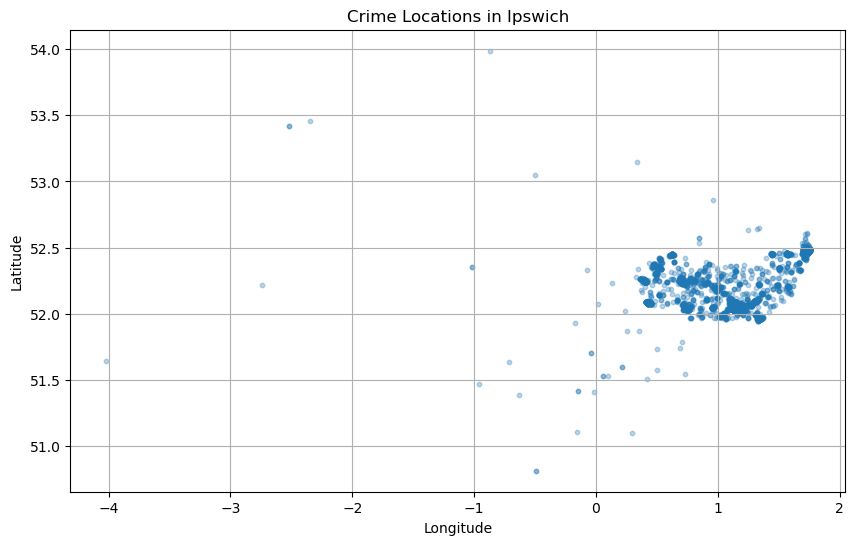

In [29]:
%matplotlib inline

# Scatter plot to show crime locations on a map
plt.figure(figsize=(10, 6))
plt.scatter(df['Longitude'], df['Latitude'], alpha=0.3, s=10)  # Plot each crime
plt.title('Crime Locations in Ipswich')  # Add a title
plt.xlabel('Longitude')  # X-axis label
plt.ylabel('Latitude')   # Y-axis label
plt.grid(True)           # Add grid lines
plt.show()               # Show the map

## Data Cleaning & Data Transformation

In [4]:
# Drop column 'Context'
if 'Context' in df.columns:
    df.drop(columns=['Context'], inplace=True)
#Drop duplicates
df.drop_duplicates(inplace=True)

# Missing values
columns_to_drop_missing = [
    'Crime ID',
    'Last outcome category',
    'Longitude',
    'Latitude',
    'LSOA code',
    'LSOA name'
]
df = df.dropna(subset=columns_to_drop_missing)

# Filter out invalid longitude and latitude ranges
df = df[(df['Longitude'] > 1.0) & (df['Longitude'] < 1.30)]
df = df[(df['Latitude'] > 51.95) & (df['Latitude'] < 52.15)]

# Convert to datatime
df['Month'] = pd.to_datetime(df['Month'], errors='coerce')
df['Month'] = df['Month'].dt.to_period('M').dt.to_timestamp()

# Extract year, month number, and month name from 'Month'
df['Year'] = df['Month'].dt.year               # 2023
df['Month_num'] = df['Month'].dt.month         # 1
df['Month_name'] = df['Month'].dt.strftime('%B')  # January

column_order = ['Crime ID', 'Month', 'Year', 'Month_num', 'Month_name',
                'Reported by', 'Falls within', 'Longitude', 'Latitude',
                'Location', 'LSOA code', 'LSOA name', 'Crime type', 'Last outcome category']
column_order = [col for col in column_order if col in df.columns]
df = df[column_order]

df.to_csv("crime_data_cleaned.csv", index=False)

In [24]:
import pandas as pd
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import time

df = pd.read_csv("crime_data_cleaned.csv")

generic_locations = [
    '', 'Supermarket', 'Shopping Area', 'Parking Area', 'B1076',
    'Nightclub', 'Sports/Recreation Area', 'Bus/Coach Station',
    'Hospital', 'Petrol Station', 'Theatre/Concert Hall'
]

df['Location'] = df['Location'].fillna('')
mask_to_fix = df['Location'].isin(generic_locations)
total_to_update = mask_to_fix.sum()

if total_to_update == 0:
    print("All generic locations have already been corrected. Nothing to do.")
else:
    print(f"Total rows to geocode: {total_to_update}")

    # 4. Setup geocoder
    geolocator = Nominatim(user_agent="ipswich-crime-cleaner")
    geocode = RateLimiter(geolocator.reverse, min_delay_seconds=1.1)
    coord_to_street = {}

    def get_street_name(lat, lon):
        key = (round(lat, 6), round(lon, 6))  # Round coordinates to group similar
        if key in coord_to_street:
            return coord_to_street[key]
        try:
            location = geocode(key)
            street = location.raw['address'].get('road', 'Unknown street') if location else 'Unknown street'
        except:
            street = 'Unknown street'
        coord_to_street[key] = street
        return street

    # 5. Make a copy of the data to modify
    df_fixed = df.copy()
    chunk_size = 100
    indices_to_update = df[mask_to_fix].index

    for start in range(0, len(indices_to_update), chunk_size):
        end = min(start + chunk_size, len(indices_to_update))
        chunk_indices = indices_to_update[start:end]
        print(f"🚧 Processing rows {start} to {end - 1}...")

        for i in chunk_indices:
            lat = df_fixed.at[i, 'Latitude']
            lon = df_fixed.at[i, 'Longitude']
            street = get_street_name(lat, lon)
            df_fixed.at[i, 'Location'] = street

        df_fixed.to_csv("Right_Location.csv", index=False)
        print(f"Progress saved at row {end - 1}")
        time.sleep(1)  # Optional safety delay

    # 6. Final check
    remaining = df_fixed['Location'].isin(generic_locations).sum()
    if remaining == 0:
        print("All generic locations have been successfully replaced!")
    else:
        print(f"{remaining} rows still have generic location. You may run again.")

All generic locations have already been corrected. Nothing to do.


In [7]:
df_cleaned = pd.read_csv("crime_data_cleaned.csv")
df_right_location = pd.read_csv("Right_Location.csv")[['Crime ID', 'Location']]

if 'Location' in df_cleaned.columns:
    df_cleaned = df_cleaned.drop(columns=['Location'])

df_merged = pd.merge(df_cleaned, df_right_location, on='Crime ID', how='left')

# 5. Verificar columnas finales
print("df_cleaned shape:", df_cleaned.shape)
print("df_right_location shape:", df_right_location.shape)
print("Final columns:", df_merged.columns.tolist())
print("Final shape:", df_merged.shape)

df_merged.to_csv("crime_data_cleaned_with_correct_location.csv", index=False)

print("Location column replaced and file saved successfully!")

df_cleaned shape: (41451, 13)
df_right_location shape: (41451, 2)
Final columns: ['Crime ID', 'Month', 'Year', 'Month_num', 'Month_name', 'Reported by', 'Falls within', 'Longitude', 'Latitude', 'LSOA code', 'LSOA name', 'Crime type', 'Last outcome category', 'Location']
Final shape: (41451, 14)
Location column replaced and file saved successfully!


In [9]:
print("Before merge:", df_cleaned.shape[0])
print("After merge: ", df_merged.shape[0])

Before merge: 41451
After merge:  41451


In [11]:
print(df['Year'].value_counts())

Year
2022    15145
2023    13704
2024    12602
Name: count, dtype: int64


In [13]:
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")
df['Year'] = df['Year'].astype(int)
min_count = df['Year'].value_counts().min()

df_balanced = (
    df.groupby('Year')
    .apply(lambda x: x.sample(min_count, random_state=42))
    .reset_index(drop=True)
)
df_balanced.to_csv("crime_data_cleaned_with_correct_location.csv", index=False)
print(df_balanced['Year'].value_counts())

Year
2022    12602
2023    12602
2024    12602
Name: count, dtype: int64


/var/folders/hy/yn4h0w_x7x1dtnhxt9y0skmr0000gn/T/ipykernel_92847/3305045556.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [15]:
# Load the data
df_socioeconomic = pd.read_csv("crime_data_cleaned_with_correct_location.csv")

# Define socioeconomic dictionaries
employment_dict = {
    2022: 84.1,
    2023: 85.9,
    2024: 80.0
}
unemployment_dict = {
    2022: 2.7,
    2023: 3.7,
    2024: 4.1
}
economic_activity_dict = {
    2022: 84.8,
    2023: 88.0,
    2024: 85.4
}
economic_inactivity_dict = {
    2022: 15.2,
    2023: 12.0,
    2024: 14.6
}

# Add new columns based on the Year
df_socioeconomic['employment_rate'] = df_socioeconomic['Year'].map(employment_dict)
df_socioeconomic['unemployment_rate'] = df_socioeconomic['Year'].map(unemployment_dict)
df_socioeconomic['economic_activity_rate'] = df_socioeconomic['Year'].map(economic_activity_dict)
df_socioeconomic['economic_inactivity_rate'] = df_socioeconomic['Year'].map(economic_inactivity_dict)

# Save the updated DataFrame
df_socioeconomic.to_csv("crime_data_cleaned_with_correct_location.csv", index=False)

## Exploratory Data Analysis (EDA) 

In [36]:
 #Number of crimes per month vs year after balancing the rows per year
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")
df.columns = df.columns.str.strip()
crimes_by_month = df.groupby(['Year', 'Month_num']).size().reset_index(name='crime_count')

pio.renderers.default = 'browser'
custom_colors = {
    '2022': 'blue',
    '2023': 'red',
    '2024': 'green'
}
fig = px.line(
    crimes_by_month,
    x='Month_num',
    y='crime_count',
    color='Year',
    markers=True,
    labels={'Month_num': 'Month', 'crime_count': 'Number of Crimes'},
    title='Monthly Crime Trends (2022–2024)',
    color_discrete_map=custom_colors
)
fig.show()

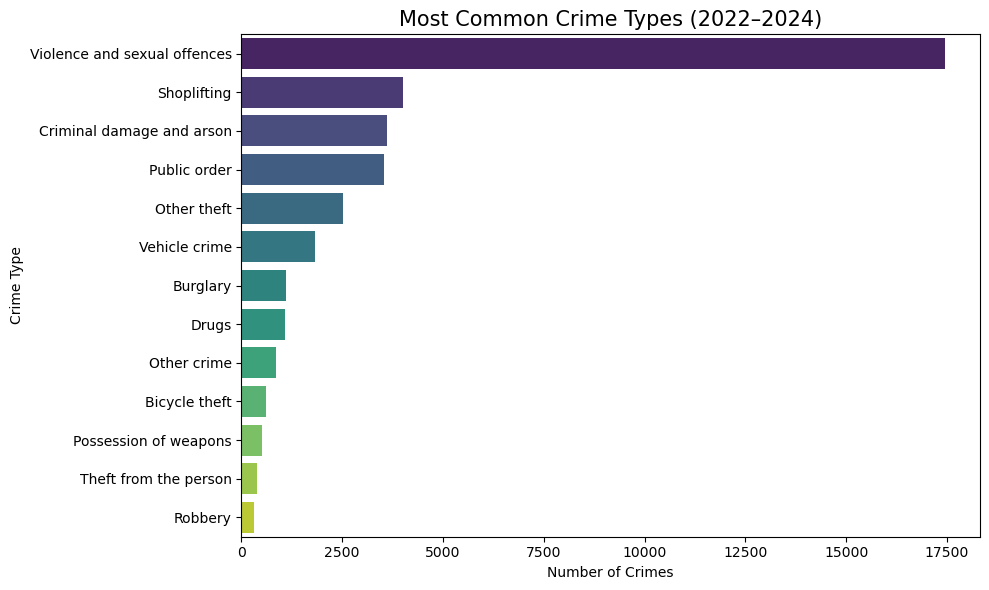

In [38]:
#Most Common Crime Types-2EDA
crime_counts = df['Crime type'].value_counts().reset_index()
crime_counts.columns = ['Crime Type', 'Count']  # Rename columns

plt.figure(figsize=(10, 6))
sns.barplot(data=crime_counts, x='Count', y='Crime Type', hue='Crime Type',
            dodge=False, palette='viridis', legend=False)
plt.title('Most Common Crime Types (2022–2024)', fontsize=15)
plt.xlabel('Number of Crimes')
plt.ylabel('Crime Type')
plt.tight_layout()
plt.show()

sns.set_style("whitegrid")

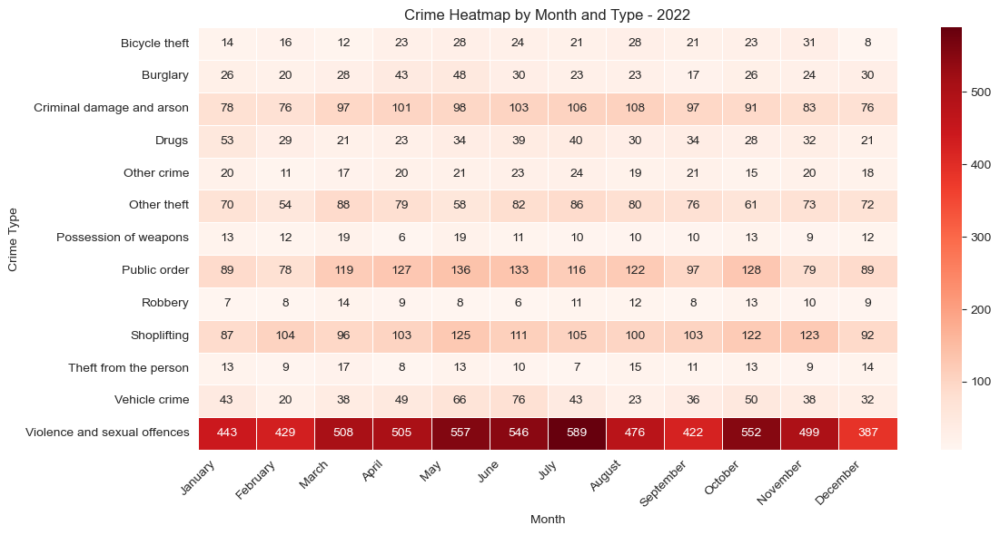

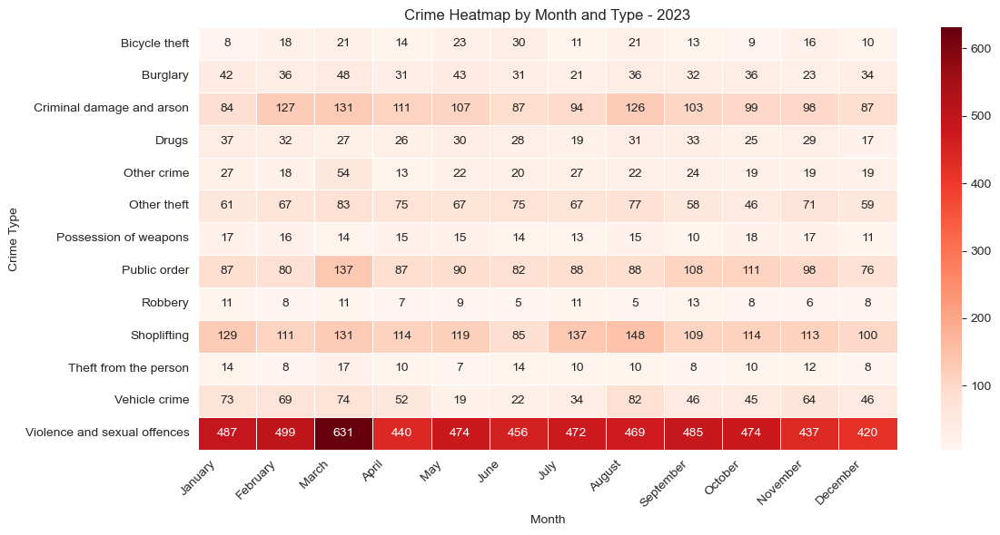

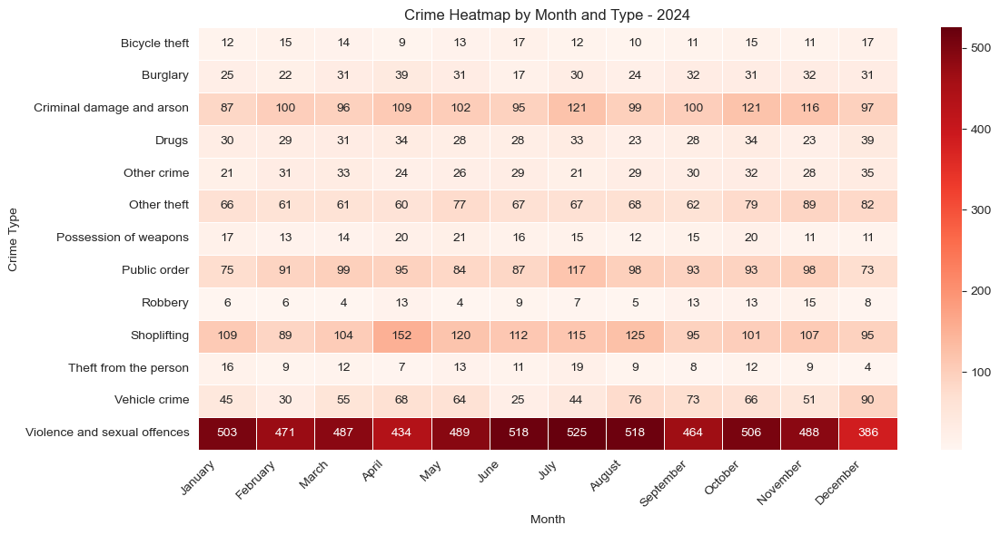

In [40]:
#Heatmap – Crimes per Month and Type-3EDA
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")

months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
# Function to create a heatmap for one year
def plot_heatmap(year):
    data_year = df[df['Year'] == year]  # Filter the dataset for a specific year
    # Create a pivot table: rows = crime types, columns = months, values = number of crimes
    pivot = data_year.groupby(['Crime type', 'Month_num']).size().unstack(fill_value=0)

    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot, cmap='Reds', annot=True, fmt='d', linewidths=.5)  # Draw heatmap
    plt.title(f'Crime Heatmap by Month and Type - {year}')
    plt.xlabel('Month')
    plt.ylabel('Crime Type')
    plt.xticks(ticks=range(12), labels=months_order, rotation=45)
    plt.tight_layout()
    plt.show()

# Show heatmaps for all years
plot_heatmap(2022)
plot_heatmap(2023)
plot_heatmap(2024)

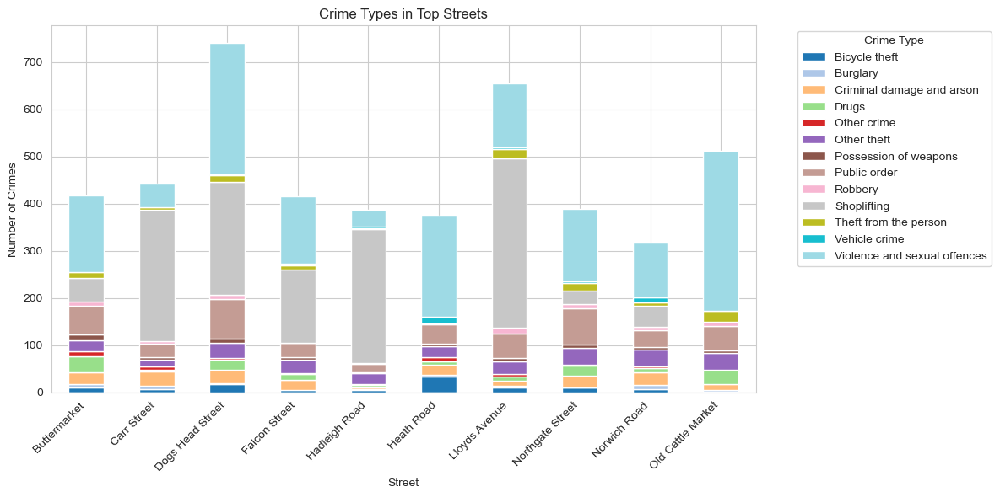

In [42]:
#Distribution of Crime Types in Most Dangerous Streets-6EDA
df = pd.read_csv('crime_data_cleaned_with_correct_location.csv')
# Identify the top 10 most dangerous streets by number of crimes
top_locations = df['Location'].value_counts().head(10).index
# Filter the dataset to include only those top locations
top_df = df[df['Location'].isin(top_locations)]
# Create a pivot table showing the number of each crime type per street
crime_counts = top_df.groupby(['Location', 'Crime type']).size().unstack(fill_value=0)

crime_counts.plot(kind='bar', stacked=True, figsize=(12,6), colormap='tab20')
plt.title('Crime Types in Top Streets')
plt.ylabel('Number of Crimes')
plt.xlabel('Street')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show() 

sns.set_style("whitegrid")

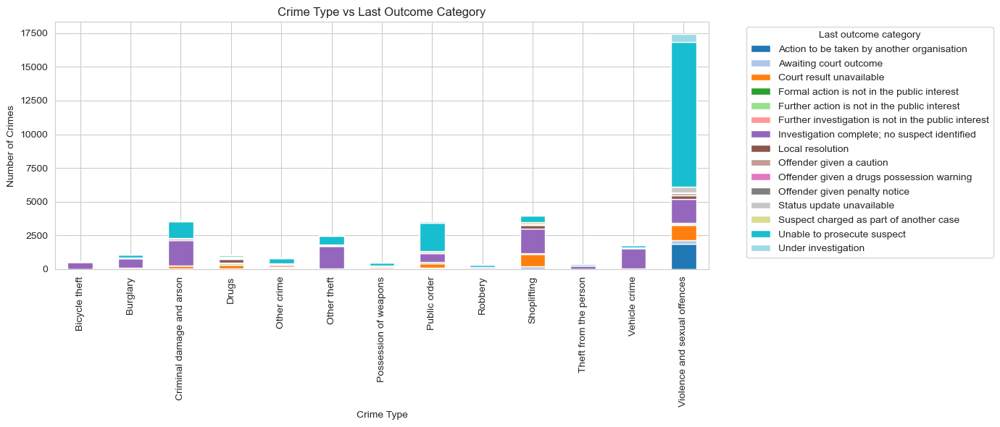

In [44]:
#Crime Type and How Cases Were Resolved-7EDA
# Create a pivot table that counts the number of cases per crime type and resolution outcome
outcome_crime = df.groupby(['Crime type', 'Last outcome category']).size().unstack().fillna(0)

# Plot with a better color palette
outcome_crime.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 6),
    colormap='tab20'  # Puedes cambiar a 'Set3', 'Paired', etc.
)

plt.title('Crime Type vs Last Outcome Category')
plt.xlabel('Crime Type')
plt.ylabel('Number of Crimes')
plt.legend(title='Last outcome category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

sns.set_style("whitegrid")

In [46]:
#Heatmap on Ipswich map-4EDA
import folium
from folium.plugins import HeatMap

heat_df = df[['Latitude', 'Longitude']].dropna()  # Get location data
m = folium.Map(location=[52.0560, 1.1480], zoom_start=13)
HeatMap(heat_df.values, radius=10).add_to(m)
m  # Show map

In [48]:
# Top 10 streets with most violence and sexual offences- 5EDA
df = pd.read_csv('crime_data_cleaned_with_correct_location.csv')
top_violence = df[df['Crime type'] == 'Violence and sexual offences'] \
    .groupby('Location') \
    .size() \
    .sort_values(ascending=False) \
    .head(10)

# Get average coordinates for each location (to be used for mapping)
location_coords = df.groupby('Location')[['Latitude', 'Longitude']].mean().reset_index()

# Convert the top 10 series into a DataFrame and rename columns
top_violence_df = top_violence.reset_index()
top_violence_df.columns = ['Location', 'Count']

# Merge the top 10 crime counts with their corresponding coordinates
top_violence_map = pd.merge(top_violence_df, location_coords, on='Location', how='left')


m = folium.Map(location=[52.0560, 1.1480], zoom_start=14)

# Draw red circles for each street
for i, row in top_violence_map.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=7,
        color='red',
        fill=True,
        fill_opacity=0.8,
        popup=f"{row['Location']}<br>Crimes: {row['Count']}"
    ).add_to(m)
m

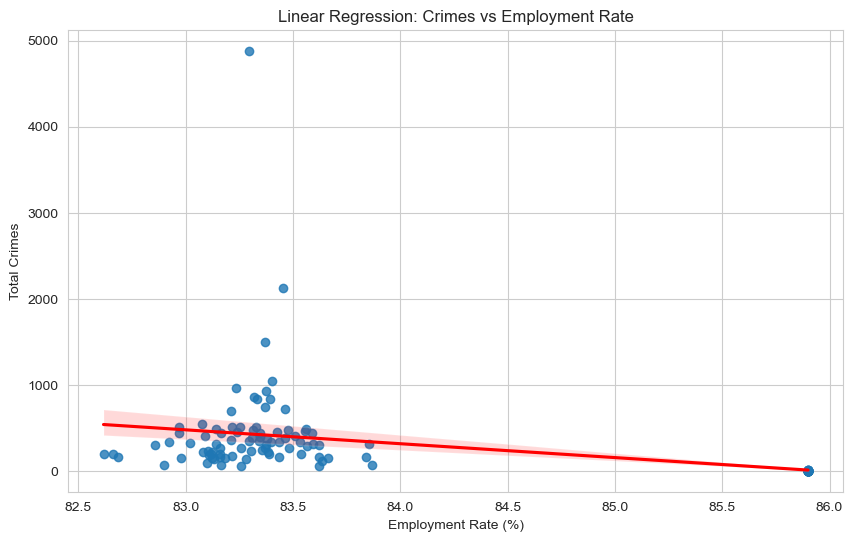

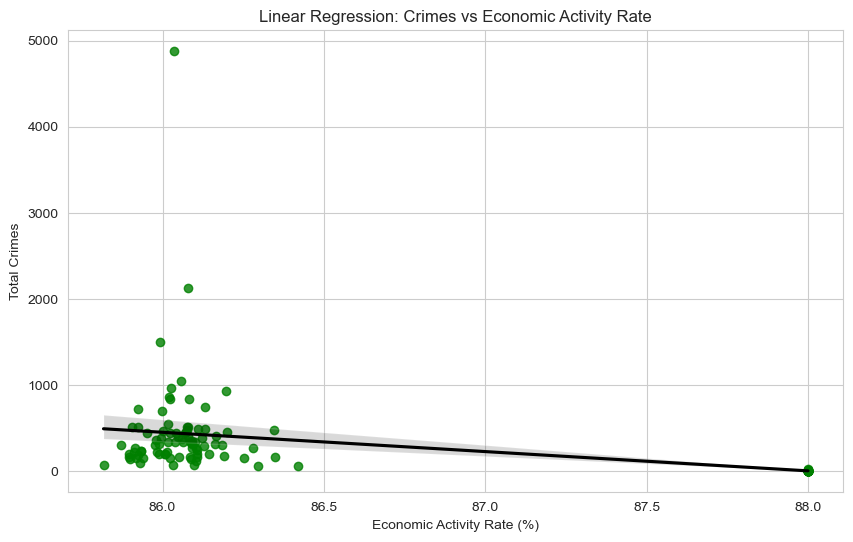

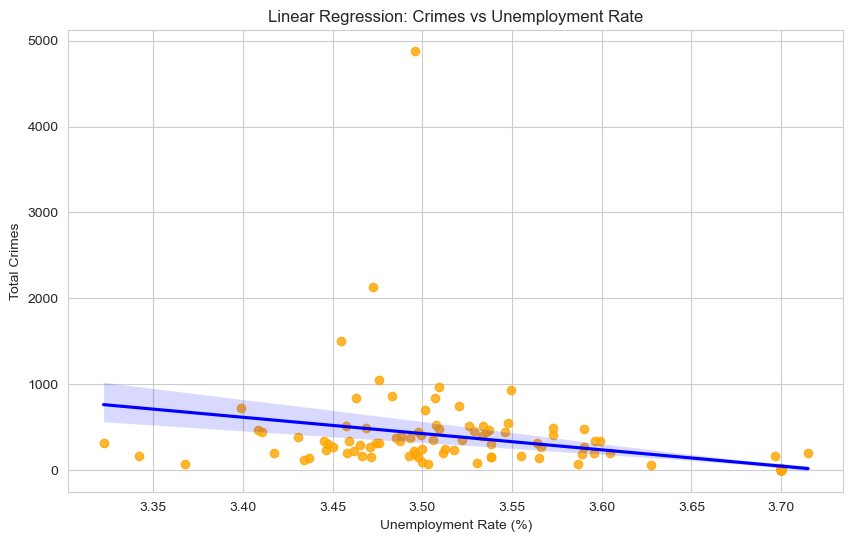

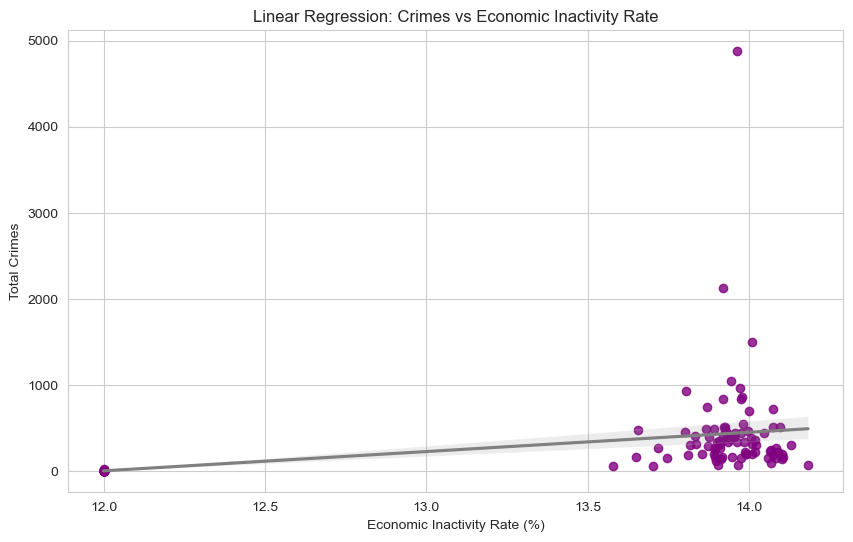

In [50]:
# Regression Plots – Total Crimes vs Socioeconomic Indicators-8EDA
df = pd.read_csv('crime_data_cleaned_with_correct_location.csv')
# Count total crimes per LSOA (Lower Layer Super Output Area)
crime_totals = df.groupby('LSOA name').size().reset_index(name='total_crimes')

# Calculate average values for socioeconomic indicators per LSOA
socio_data = df.groupby('LSOA name')[
    ['employment_rate', 'unemployment_rate', 'economic_activity_rate', 'economic_inactivity_rate']
].mean().reset_index()

# Merge crime counts with socioeconomic data
crime_by_lsoa = pd.merge(crime_totals, socio_data, on='LSOA name')

# Crimes vs Employment Rate
plt.figure(figsize=(10, 6))
sns.regplot(data=crime_by_lsoa, x='employment_rate', y='total_crimes', line_kws={'color': 'red'})
plt.title('Linear Regression: Crimes vs Employment Rate')
plt.xlabel('Employment Rate (%)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Crimes vs Economic Activity Rate
plt.figure(figsize=(10, 6))
sns.regplot(data=crime_by_lsoa, x='economic_activity_rate', y='total_crimes', color='green', line_kws={'color': 'black'})
plt.title('Linear Regression: Crimes vs Economic Activity Rate')
plt.xlabel('Economic Activity Rate (%)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Crimes vs Unemployment Rate
plt.figure(figsize=(10, 6))
sns.regplot(data=crime_by_lsoa, x='unemployment_rate', y='total_crimes', color='orange', line_kws={'color': 'blue'})
plt.title('Linear Regression: Crimes vs Unemployment Rate')
plt.xlabel('Unemployment Rate (%)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Crimes vs Economic Inactivity Rate
plt.figure(figsize=(10, 6))
sns.regplot(data=crime_by_lsoa, x='economic_inactivity_rate', y='total_crimes', color='purple', line_kws={'color': 'gray'})
plt.title('Linear Regression: Crimes vs Economic Inactivity Rate')
plt.xlabel('Economic Inactivity Rate (%)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

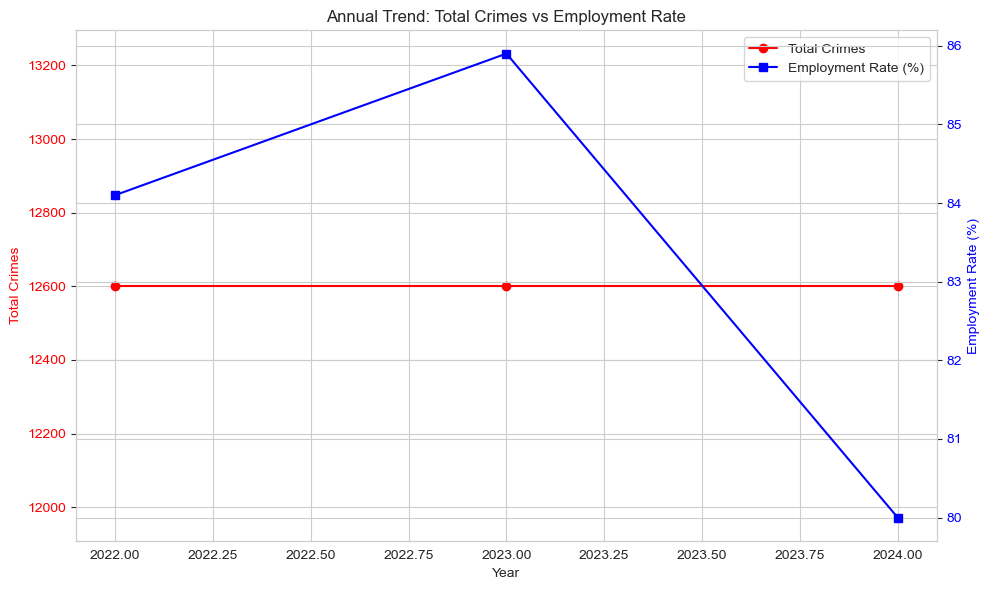

In [52]:
# Load your dataset
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")

# Group by year to calculate total crimes and employment rate
annual_trend = df.groupby('Year').agg({
    'Crime ID': 'count',
    'employment_rate': 'mean'
}).rename(columns={'Crime ID': 'Total Crimes'})

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot total crimes (red)
line1, = ax1.plot(annual_trend.index, annual_trend['Total Crimes'],
                  marker='o', color='red', label='Total Crimes')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Crimes', color='red')
ax1.tick_params(axis='y', labelcolor='red')

# Plot employment rate (blue) on a secondary axis
ax2 = ax1.twinx()
line2, = ax2.plot(annual_trend.index, annual_trend['employment_rate'],
                  marker='s', color='blue', label='Employment Rate (%)')
ax2.set_ylabel('Employment Rate (%)', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Combine both legends
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right')

# Final touches
plt.title("Annual Trend: Total Crimes vs Employment Rate")
plt.grid(True)
plt.tight_layout()
plt.show()

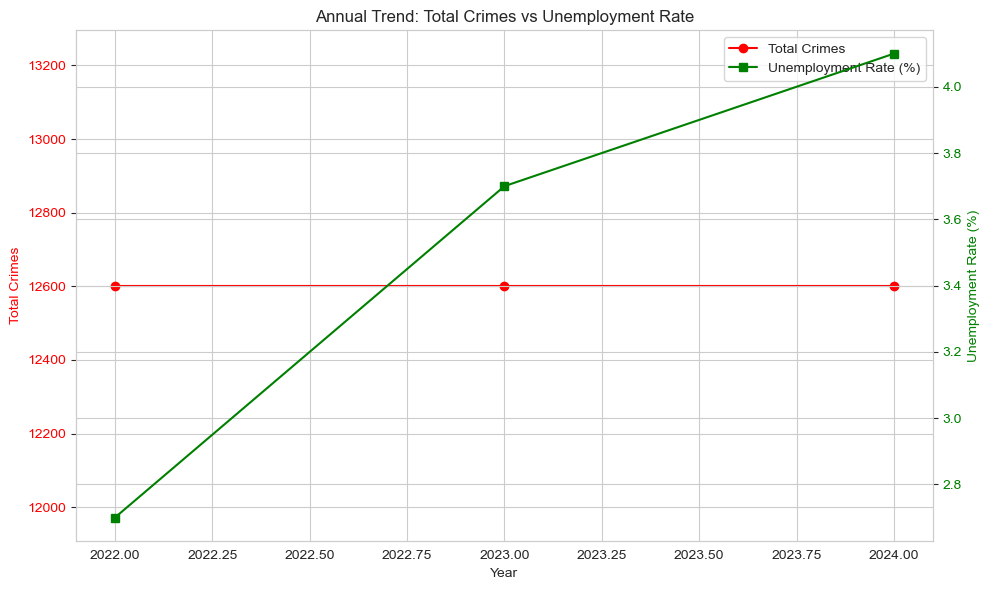

In [54]:
# Load the dataset 
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")

# Group by year: total crimes and average unemployment rate
annual_trend = df.groupby('Year').agg({
    'Crime ID': 'count',
    'unemployment_rate': 'mean'
}).rename(columns={'Crime ID': 'Total Crimes'})

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot Total Crimes (red)
line1, = ax1.plot(annual_trend.index, annual_trend['Total Crimes'],
                  marker='o', color='red', label='Total Crimes')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Crimes', color='red')
ax1.tick_params(axis='y', labelcolor='red')

# Plot Unemployment Rate (green) on second y-axis
ax2 = ax1.twinx()
line2, = ax2.plot(annual_trend.index, annual_trend['unemployment_rate'],
                  marker='s', color='green', label='Unemployment Rate (%)')
ax2.set_ylabel('Unemployment Rate (%)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Combine legends
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right')

# Final touch
plt.title("Annual Trend: Total Crimes vs Unemployment Rate")
plt.grid(True)
plt.tight_layout()
plt.show()

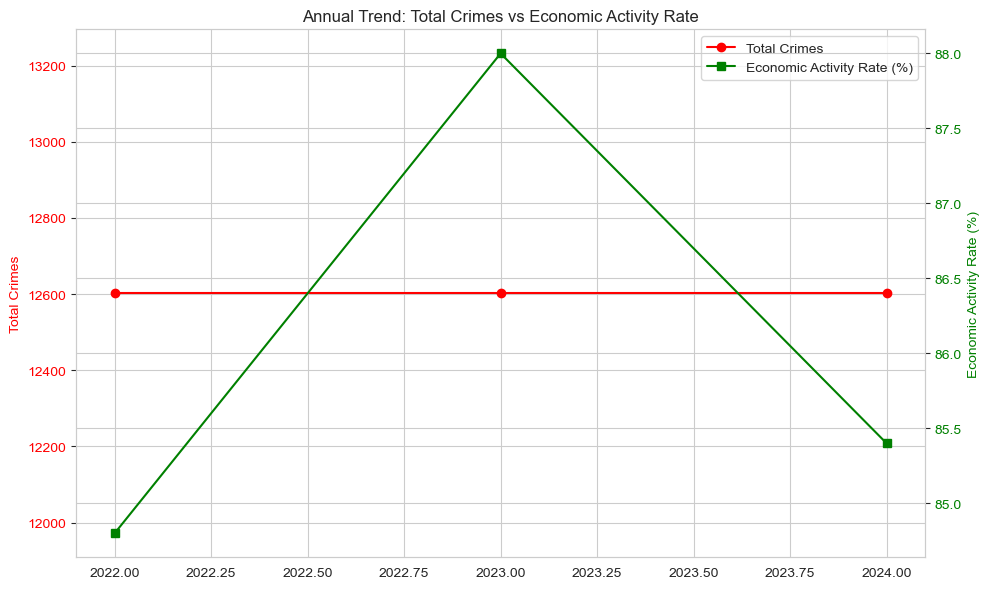

In [56]:
df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")

# AGRUPAR por año: total de crímenes y tasa de actividad/inactividad
activity_trend = df.groupby('Year').agg({
    'Crime ID': 'count',
    'economic_activity_rate': 'mean'
}).rename(columns={'Crime ID': 'Total Crimes'})

# Plot 1 – Total Crimes vs Economic Activity Rate
fig, ax1 = plt.subplots(figsize=(10, 6))

line1, = ax1.plot(activity_trend.index, activity_trend['Total Crimes'], color='red', marker='o', label='Total Crimes')
ax1.set_ylabel('Total Crimes', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()
line2, = ax2.plot(activity_trend.index, activity_trend['economic_activity_rate'], color='green', marker='s', label='Economic Activity Rate (%)')
ax2.set_ylabel('Economic Activity Rate (%)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right')

plt.title("Annual Trend: Total Crimes vs Economic Activity Rate")
plt.grid(True)
plt.tight_layout()
plt.show()

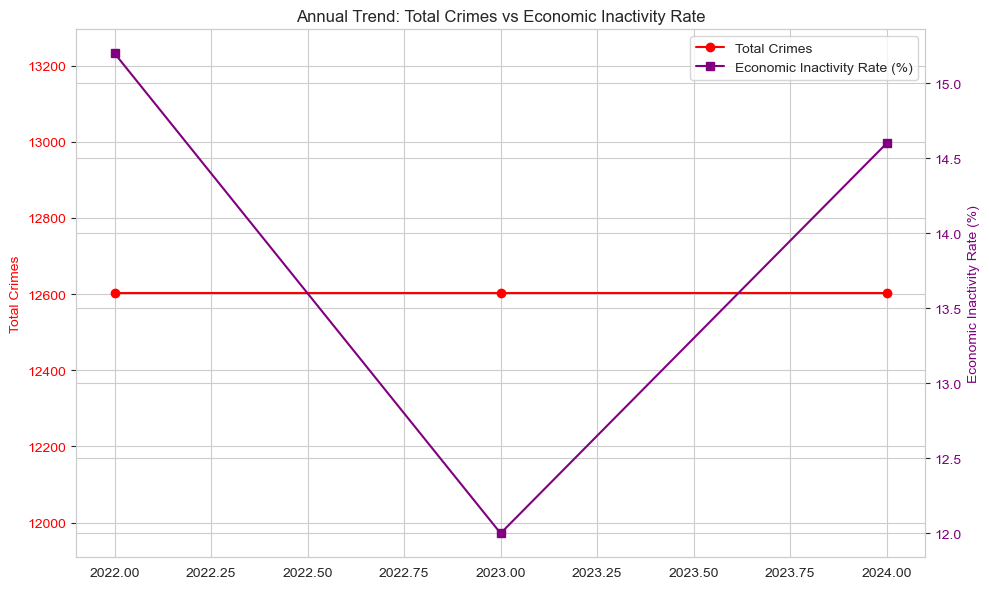

In [58]:
# Agrupar por año también para economic inactivity
inactivity_trend = df.groupby('Year').agg({
    'Crime ID': 'count',
    'economic_inactivity_rate': 'mean'
}).rename(columns={'Crime ID': 'Total Crimes'})

# Plot 2 – Total Crimes vs Economic Inactivity Rate
fig, ax1 = plt.subplots(figsize=(10, 6))

line1, = ax1.plot(inactivity_trend.index, inactivity_trend['Total Crimes'], color='red', marker='o', label='Total Crimes')
ax1.set_ylabel('Total Crimes', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()
line2, = ax2.plot(inactivity_trend.index, inactivity_trend['economic_inactivity_rate'], color='purple', marker='s', label='Economic Inactivity Rate (%)')
ax2.set_ylabel('Economic Inactivity Rate (%)', color='purple')
ax2.tick_params(axis='y', labelcolor='purple')

lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='upper right')

plt.title("Annual Trend: Total Crimes vs Economic Inactivity Rate")
plt.grid(True)
plt.tight_layout()
plt.show()

In [60]:
df['employment_rate'].describe()

count    37806.000000
mean        83.333333
std          2.468951
min         80.000000
25%         80.000000
50%         84.100000
75%         85.900000
max         85.900000
Name: employment_rate, dtype: float64

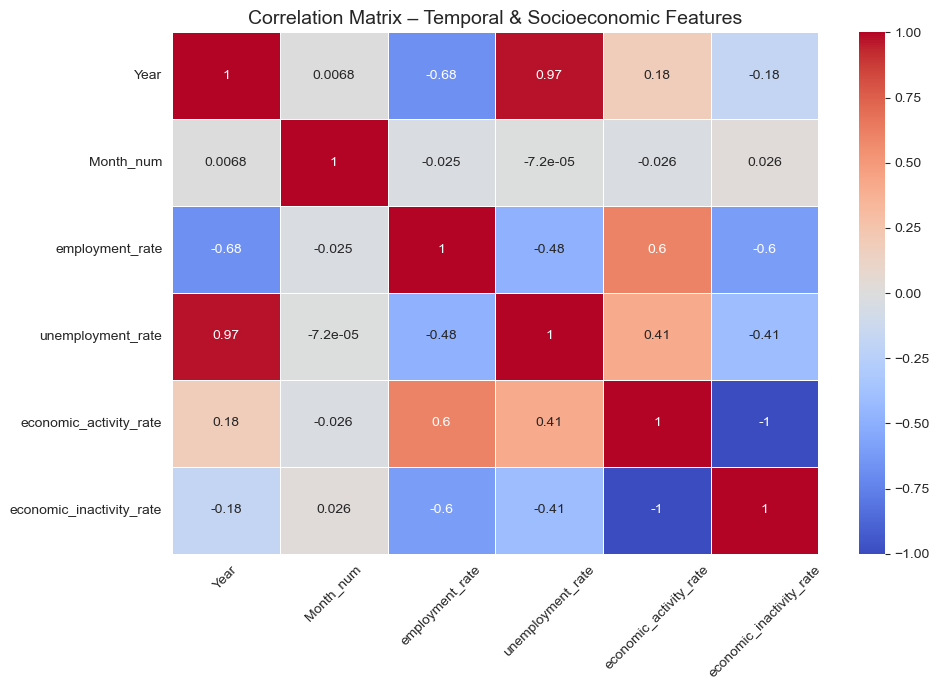

In [62]:
# Correlation Matrix – 9EDA
# Select only numeric columns related to time and socioeconomic indicators
numeric_df = df[[
    'Year',
    'Month_num',
    'employment_rate',
    'unemployment_rate',
    'economic_activity_rate',
    'economic_inactivity_rate'
]]

# Compute correlation matrix
correlation_matrix = numeric_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 7))  # Bigger size for more variables
sns.heatmap(
    correlation_matrix,
    annot=True,        # Show correlation values
    cmap='coolwarm',   # Red to blue gradient
    linewidths=0.5     # White lines between cells
)
plt.title('Correlation Matrix – Temporal & Socioeconomic Features', fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Clustering Analysis

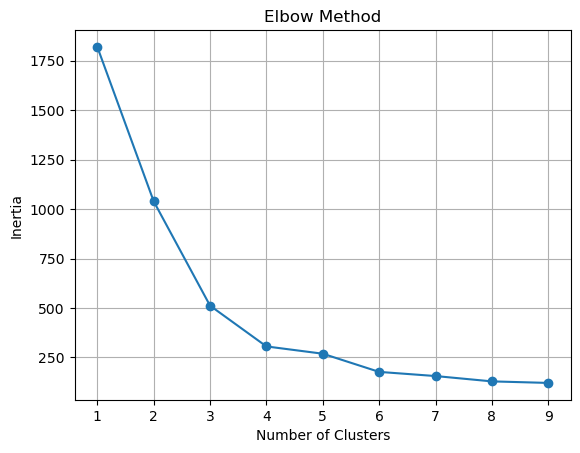

k=2 → Silhouette Score: 0.72
k=3 → Silhouette Score: 0.47
k=4 → Silhouette Score: 0.52
k=5 → Silhouette Score: 0.47


In [51]:
# Load data and create pivot table
df = pd.read_csv('crime_data_cleaned_with_correct_location.csv')
pivot = df.pivot_table(index='LSOA name', columns='Crime type', aggfunc='size', fill_value=0)
pivot['Latitude'] = df.groupby('LSOA name')['Latitude'].mean()
pivot['Longitude'] = df.groupby('LSOA name')['Longitude'].mean()

# Standardise features
features = pivot.drop(columns=['Latitude', 'Longitude'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Elbow Method
inertia = []
for k in range(1, 10):
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(X_scaled)
    inertia.append(model.inertia_)

plt.plot(range(1, 10), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

# Silhouette Scores
for k in range(2, 6):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    print(f'k={k} → Silhouette Score: {score:.2f}')

# Final Clustering with chosen k
optimal_k = 4  # (you choose this)
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42)
pivot['Cluster'] = kmeans_final.fit_predict(X_scaled)

pivot.to_csv('pivot_for_clustering.csv', index=True)

In [168]:
# Apply K-Means clustering with k=4 based on prior evaluation (Elbow & Silhouette)-13EDA
kmeans = KMeans(n_clusters=4, random_state=42)
pivot['Cluster'] = kmeans.fit_predict(X_scaled)

# Visualise clusters
import folium
m = folium.Map(location=[52.0560, 1.1480], zoom_start=12)  # Create map
colors = ['red', 'blue', 'green', 'orange']               # Set colours for clusters

for i, row in pivot.iterrows():                           # Draw circle for each LSOA
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[int(row['Cluster'])],
        fill=True,
        fill_opacity=0.7,
        popup=f"LSOA: {i}<br>Cluster: {row['Cluster']}"
    ).add_to(m)
m  # Show the map


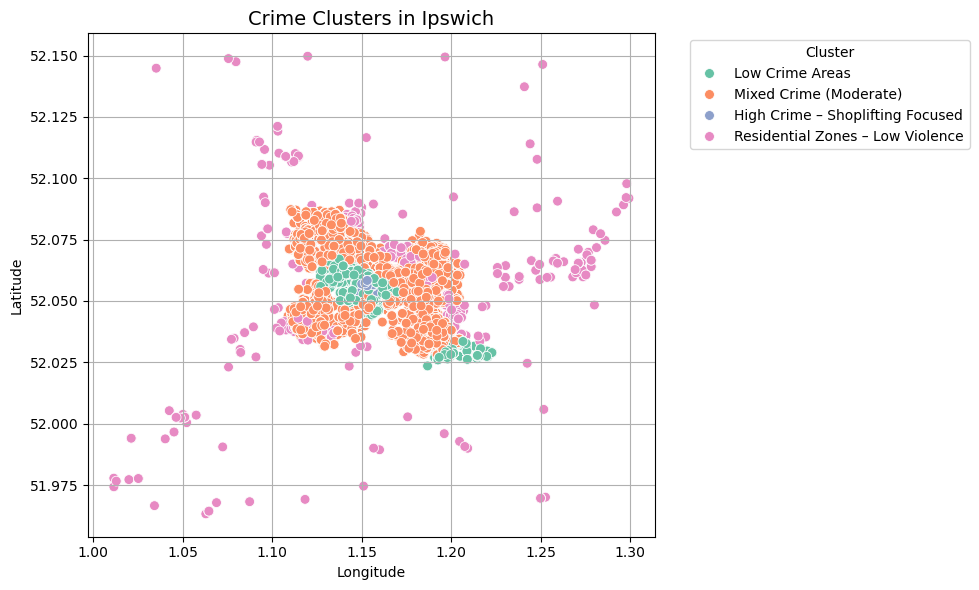

In [53]:
pivot = pd.read_csv('pivot_for_clustering.csv')

cluster_labels = {
    0: 'Low Crime Areas',
    1: 'Mixed Crime (Moderate)',
    2: 'Residential Zones – Low Violence',
    3: 'High Crime – Shoplifting Focused'
}

pivot['Cluster Label'] = pivot['Cluster'].map(cluster_labels)
df = df.merge(pivot[['LSOA name','Cluster','Cluster Label']], on='LSOA name', how='left')

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='Longitude', y='Latitude',
    hue='Cluster Label',
    palette='Set2', 
    s=50
)
plt.title("Crime Clusters in Ipswich", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

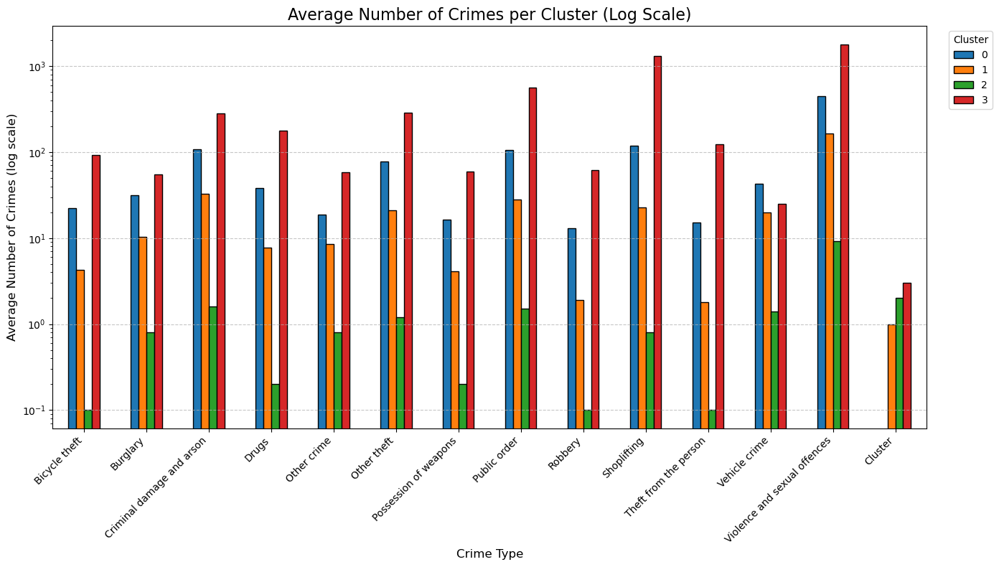

In [55]:
pivot = pd.read_csv('pivot_for_clustering.csv')

# Detect crime-type columns (exclude unrelated)
crime_columns = pivot.select_dtypes(include='number').columns.tolist()
crime_columns = [
    col for col in crime_columns
    if col not in ['Latitude', 'Longitude', 'employment_rate',
                   'unemployment_rate', 'economic_activity_rate',
                   'economic_inactivity_rate', 'DBSCAN Cluster']
]

# Group by cluster and calculate average
cluster_crime_avg = pivot.groupby('Cluster')[crime_columns].mean().round(1)

# Plot in log scale
cluster_crime_avg.T.plot(kind='bar', figsize=(14, 8), edgecolor='black')
plt.yscale('log')
plt.title('Average Number of Crimes per Cluster (Log Scale)', fontsize=16)
plt.ylabel('Average Number of Crimes (log scale)', fontsize=12)
plt.xlabel('Crime Type', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

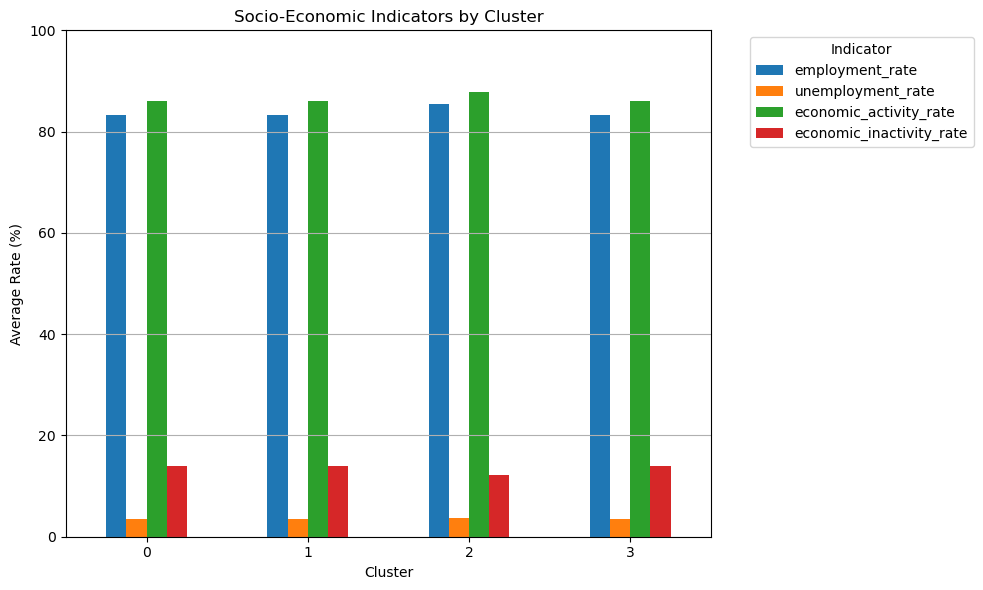

In [83]:
df = pd.read_csv('crime_data_cleaned_with_correct_location.csv')

# Load the pivot table
pivot = pd.read_csv('pivot_for_clustering.csv')

# Add socio-economic indicators per LSOA
pivot['employment_rate'] = df.groupby('LSOA name')['employment_rate'].mean().values
pivot['unemployment_rate'] = df.groupby('LSOA name')['unemployment_rate'].mean().values
pivot['economic_activity_rate'] = df.groupby('LSOA name')['economic_activity_rate'].mean().values
pivot['economic_inactivity_rate'] = df.groupby('LSOA name')['economic_inactivity_rate'].mean().values

# Add total number of crimes per LSOA
crime_totals = df.groupby('LSOA name').size().reset_index(name='total_crimes')
pivot = pivot.merge(crime_totals, on='LSOA name', how='left')

# Group by cluster and calculate average values for all indicators
socio_by_cluster = pivot.groupby('Cluster')[
    ['employment_rate', 'unemployment_rate', 'economic_activity_rate', 
     'economic_inactivity_rate', 'total_crimes']
].mean().round(2)

# Plot socio-economic indicators (excluding total_crimes)
socio_by_cluster.drop(columns='total_crimes').plot(kind='bar', figsize=(10, 6))

plt.title('Socio-Economic Indicators by Cluster')
plt.ylabel('Average Rate (%)')
plt.ylim(0, 100)
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.legend(title='Indicator', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## Predictive Modeling

In [85]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split


df = pd.read_csv("crime_data_cleaned_with_correct_location.csv")
df_predictive = df[[
    'Crime ID', 'Month', 'Longitude', 'Latitude',
    'employment_rate', 'economic_activity_rate',
    'LSOA name', 'Crime type'
]].copy()

df_predictive['Month'] = pd.to_datetime(df_predictive['Month'], errors='coerce')
df_predictive['Year'] = df_predictive['Month'].dt.year

columns_needed = [
    'Latitude', 'Longitude',
    'employment_rate', 'economic_activity_rate',
    'Crime type', 'LSOA name'
]
df_predictive = df_predictive.dropna(subset=columns_needed)
df_predictive['District'] = df_predictive['LSOA name'].str.extract(r'^([A-Za-z ]+)')


le_district = LabelEncoder()
df_predictive['District_encoded'] = le_district.fit_transform(df_predictive['District'])
le_crime = LabelEncoder()
df_predictive['Crime_encoded'] = le_crime.fit_transform(df_predictive['Crime type'])
features = [
    'Latitude', 'Longitude',
    'employment_rate', 'economic_activity_rate',
    'District_encoded'
]
target = 'Crime_encoded'

X = df_predictive[features]
y = df_predictive[target]


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

df_predictive.to_csv("crime_data_for_prediction.csv", index=False)
print("Prediction dataset saved as 'crime_data_for_prediction.csv'")

Prediction dataset saved as 'crime_data_for_prediction.csv'


In [87]:
# Train the Random Forest model
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict class probabilities
y_proba = rf_model.predict_proba(X_test)

# Create a DataFrame with human-readable crime type labels
crime_type_cols = list(le_crime.inverse_transform(range(y_proba.shape[1])))

proba_df = pd.DataFrame(
    y_proba,
    columns=crime_type_cols,
    index=X_test.index
)

# Get the most probable crime type per row
proba_df['Top Crime Type'] = proba_df.idxmax(axis=1)

# 5. Add columns for spatial and temporal analysis
proba_df['District'] = le_district.inverse_transform(X_test['District_encoded'])
proba_df['Latitude'] = df_predictive.loc[X_test.index, 'Latitude']
proba_df['Longitude'] = df_predictive.loc[X_test.index, 'Longitude']
proba_df['Year'] = df_predictive.loc[X_test.index, 'Year']
proba_df['Month'] = df_predictive.loc[X_test.index, 'Month']

# Añadir la columna 'Top Crime Type' al DataFrame original de predicción
df_predictive.loc[X_test.index, 'Top Crime Type'] = proba_df['Top Crime Type']


df_predictive.to_csv("crime_data_for_prediction.csv", index=False)
print(" 'Top Crime Type' added and saved to 'crime_data_for_prediction.csv'")

 'Top Crime Type' added and saved to 'crime_data_for_prediction.csv'


                     Crime type  Predicted Probability
0  Violence and sexual offences               0.462588
1                   Shoplifting               0.104346
2     Criminal damage and arson               0.098259
3                  Public order               0.095659
4                   Other theft               0.063356


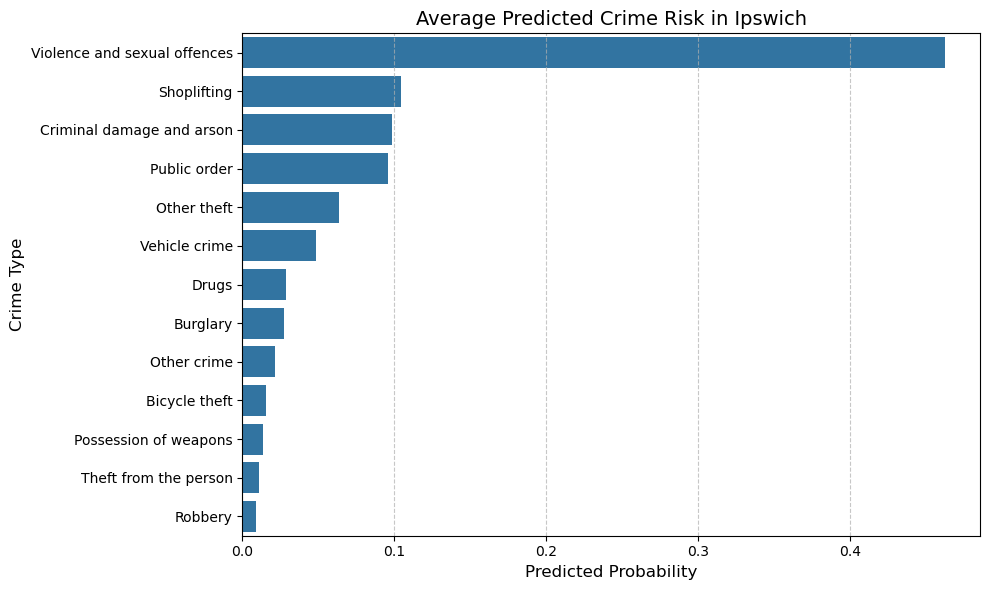

In [89]:
# Average risk per crime type for Ipswich
proba_df['District'] = proba_df['District'].str.strip()
# Calculate average predicted probabilities for Ipswich
ipswich_avg = proba_df[proba_df['District'] == 'Ipswich'][crime_type_cols].mean().sort_values(ascending=False)

# Convert the result into a DataFrame for plotting
ipswich_avg_df = ipswich_avg.reset_index()
ipswich_avg_df.columns = ['Crime type', 'Predicted Probability']
print(ipswich_avg_df.head())

# Plot the average predicted crime risk in Ipswich
plt.figure(figsize=(10, 6))
sns.barplot(
    data=ipswich_avg_df,
    x='Predicted Probability',
    y='Crime type',
)
plt.title("Average Predicted Crime Risk in Ipswich", fontsize=14)
plt.xlabel("Predicted Probability", fontsize=12)
plt.ylabel("Crime Type", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

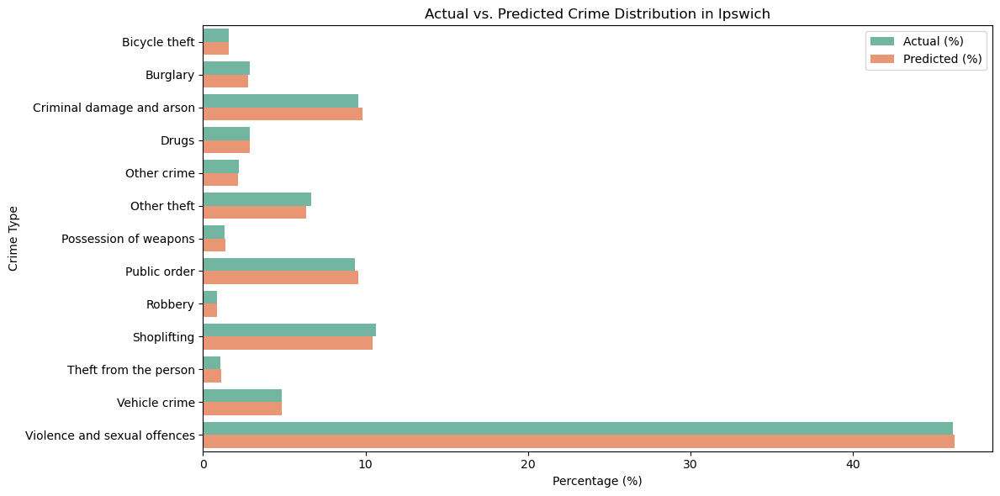

In [91]:
#Calculate actual crime distribution in Ipswich (percentage)
# Actual crime distribution
actual_counts = df[df['LSOA name'].str.contains('Ipswich')]['Crime type'].value_counts(normalize=True).sort_index()

# Clean and align columns
proba_df['District'] = proba_df['District'].str.strip()
predicted_avg = proba_df[proba_df['District'] == 'Ipswich'][crime_type_cols].mean()
predicted_avg = predicted_avg[actual_counts.index]

# Create comparison DataFrame
comparison_df = pd.DataFrame({
    'Crime Type': actual_counts.index,
    'Actual (%)': actual_counts.values * 100,
    'Predicted (%)': predicted_avg.values * 100
})

# Melt for plotting
comparison_melted = comparison_df.melt(id_vars='Crime Type', var_name='Type', value_name='Percentage')

# Plot comparison
plt.figure(figsize=(12, 6))
sns.barplot(data=comparison_melted, x='Percentage', y='Crime Type', hue='Type', palette='Set2')
plt.title('Actual vs. Predicted Crime Distribution in Ipswich')
plt.xlabel('Percentage (%)')
plt.ylabel('Crime Type')
plt.legend(title='')
plt.tight_layout()
plt.show()

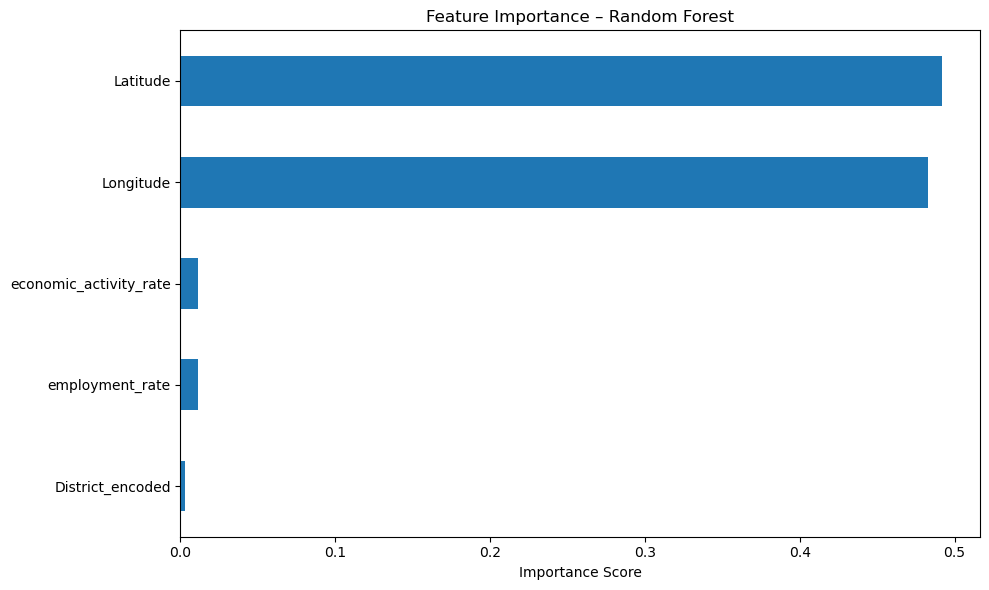

In [107]:
importances = rf_model.feature_importances_
forest_importances = pd.Series(importances, index=X.columns)
forest_importances.sort_values().plot(kind='barh', figsize=(10, 6))
plt.title('Feature Importance – Random Forest')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

In [99]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from IPython.display import display


df_pred = pd.read_csv("crime_data_for_prediction.csv")
df_pred = df_pred.dropna(subset=['Latitude', 'Longitude', 'Top Crime Type'])

import plotly.express as px
crime_types = sorted(df_pred['Top Crime Type'].dropna().unique())
colors = px.colors.qualitative.Set3
crime_colors = {crime: colors[i % len(colors)] for i, crime in enumerate(crime_types)}

# Create map centered in Ipswich
m = folium.Map(location=[52.0567, 1.1482], zoom_start=13)
marker_cluster = MarkerCluster().add_to(m)

# Add circle markers by prediction
for _, row in df_pred.dropna(subset=['Latitude', 'Longitude', 'Top Crime Type']).iterrows():
    crime_type = row['Top Crime Type']
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=crime_colors.get(crime_type, 'gray'),
        fill=True,
        fill_opacity=0.6,
        popup=f"Predicted: {crime_type}"
    ).add_to(marker_cluster)
m

In [101]:
from sklearn.metrics import accuracy_score
y_test_decoded = le_crime.inverse_transform(y_test)

y_test_reset = pd.Series(y_test_decoded).reset_index(drop=True)
top_crime_reset = proba_df['Top Crime Type'].reset_index(drop=True)
year_reset = proba_df['Year'].reset_index(drop=True)

print(" Accuracy by Year:")
for year in sorted(year_reset.unique()):
    year_indices = year_reset[year_reset == year].index
    acc = accuracy_score(y_test_reset.iloc[year_indices], top_crime_reset.iloc[year_indices])
    print(f"  - {year}: {acc:.2f}")

 Accuracy by Year:
  - 2022: 0.49
  - 2023: 0.49
  - 2024: 0.49


In [103]:
from sklearn.metrics import f1_score

f1 = f1_score(y_test_reset, top_crime_reset, average='weighted')
print(f"Weighted F1-score: {f1:.2f}")

Weighted F1-score: 0.41


<Figure size 800x600 with 0 Axes>

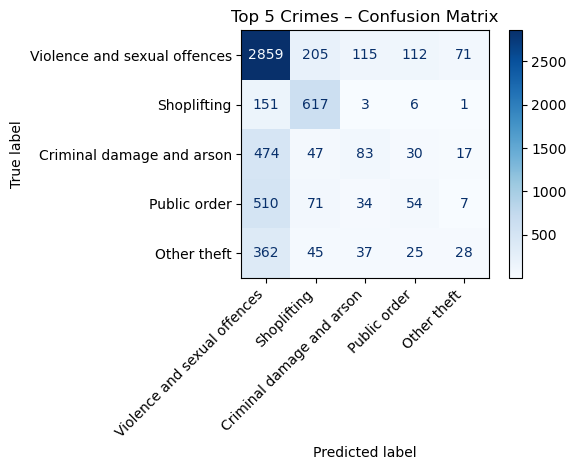

In [105]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
top_5_crimes = df['Crime type'].value_counts().head(5).index.tolist()
top_5_mask = y_test_reset.isin(top_5_crimes)

cm_top5 = confusion_matrix(
    y_test_reset[top_5_mask],
    top_crime_reset[top_5_mask],
    labels=top_5_crimes
)
plt.figure(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_top5, display_labels=top_5_crimes)
ax = disp.plot(cmap='Blues')

plt.xticks(rotation=45, ha='right')
plt.title("Top 5 Crimes – Confusion Matrix")
plt.tight_layout()
plt.show()

## Conclusions

This analysis provided a comprehensive overview of crime in Ipswich from 2022 to 2024 using a structured CRISP-DM approach. By integrating exploratory data analysis, clustering, and predictive modeling, the project successfully uncovered key spatial and temporal trends in criminal activity.
Monthly trends revealed peaks in July and December, often associated with holidays and increased mobility. Spatially, areas like Dogs Head Street and Lloyds Avenue consistently appeared as hotspots, particularly for shoplifting and sexual offences. The use of reverse geocoding greatly enhanced location precision, improving the quality of spatial analysis.
Clustering with K-Means (k=4) produced four distinct area profiles, ranging from low-crime residential zones to high-risk commercial areas. These patterns offer valuable insights for urban planning and policing strategies.
The Random Forest predictive model added a forward-looking layer to the dashboard, predicting the most likely crime type in given areas based on geographic and socioeconomic features. While not perfectly accurate, the model proved useful for risk profiling and interactive visualisation.
Overall, this multi-layered project demonstrated how data-driven methods can support local crime prevention strategies by identifying when and where interventions are most needed.

## Limitations

Despite its strengths, the project faces several limitations:

- **Short Timeframe**: The data covers only three years, limiting the ability to capture long-term crime trends or seasonality patterns beyond the observed period.
- **Class Imbalance**: The predictive model performed better on common crime types but struggled with rarer categories, suggesting a need for class balancing techniques or more representative data.
- **Limited Socioeconomic Insights**: Although employment and activity rates were included, they showed only weak correlations with crime levels. Including more granular variables like population turnover, deprivation index, or education level could improve explanatory power.
- **Reverse Geocoding Constraints**: Enhancing spatial accuracy via reverse geocoding was valuable but slow and limited by API restrictions, affecting scalability.
- **Model Transparency**: While Random Forest offered robustness, its black-box nature made interpretability challenging. Tools like decision trees could enhance transparency and user trust in future iterations.
- **Static Dataset**: The use of static data snapshots rather than live updates means the dashboard may not reflect current trends unless regularly refreshed.